In [1]:
import torch
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

from scarches.dataset.trvae.data_handling import remove_sparsity
from lataq.models import EMBEDCVAE
from lataq.exp_dict import EXPERIMENT_INFO

sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=500)
plt.rcParams['figure.figsize'] = (5, 5)
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

%load_ext autoreload
%autoreload 2

In [2]:
PARAMS = {
    'EPOCHS': 50,                                      #TOTAL TRAINING EPOCHS
    'N_PRE_EPOCHS': 40,                                #EPOCHS OF PRETRAINING WITHOUT LANDMARK LOSS
    #'DATA_DIR': '../../lataq_reproduce/data',          #DIRECTORY WHERE THE DATA IS STORED
    #'DATA': 'pancreas',                                #DATA USED FOR THE EXPERIMENT
    'EARLY_STOPPING_KWARGS': {                         #KWARGS FOR EARLY STOPPING
        "early_stopping_metric": "val_landmark_loss",  ####value used for early stopping
        "mode": "min",                                 ####choose if look for min or max
        "threshold": 0,
        "patience": 20,
        "reduce_lr": True,
        "lr_patience": 13,
        "lr_factor": 0.1,
    },
    'LABELED_LOSS_METRIC': 'dist',           
    'UNLABELED_LOSS_METRIC': 'dist',
    'LATENT_DIM': 25,
    'ALPHA_EPOCH_ANNEAL': 1e3,
    'CLUSTERING_RES': 2,
    'HIDDEN_LAYERS': 3,
    'ETA': 5,
}

In [3]:
adata = sc.read(
    '../data/hlca_counts.h5ad'
)
#adata = adata[:, adata.var.highly_variable].copy()
#adata.X

In [4]:
sc.pl.umap(adata, color='ann_finest_level')

In [5]:
adata.obs.groupby('study').size()

study
Banovich_Kropski_2020     121881
Barbry_Leroy_2020          74486
Jain_Misharin_2021         45557
Krasnow_2020               60977
Lafyatis_Rojas_2019        24180
Meyer_2019                 35522
Misharin_2021              64842
Misharin_Budinger_2018     41216
Nawijn_2021                70401
Seibold_2020               33593
Teichmann_Meyer_2019       12229
dtype: int64

In [6]:
condition_key = 'subject_ID'
cell_type_key = ['ann_finest_level']

In [7]:
lataq_model = EMBEDCVAE(
    adata=adata,
    condition_key=condition_key,
    cell_type_keys=cell_type_key,
    hidden_layer_sizes=[128]*2,
    latent_dim=50,
    embedding_dim=32,
    inject_condition=['encoder', 'decoder']
)

Embedding dictionary:
 	Num conditions: 107
 	Embedding dim: 32
Encoder Architecture:
	Input Layer in, out and cond: 1996 128 32
	Hidden Layer 1 in/out: 128 128
	Mean/Var Layer in/out: 128 50
Decoder Architecture:
	First Layer in, out and cond:  50 128 32
	Hidden Layer 1 in/out: 128 128
	Output Layer in/out:  128 1996 



In [8]:
lataq_model.train(
    n_epochs=100,
    pretraining_epochs=80,
    early_stopping_kwargs=PARAMS['EARLY_STOPPING_KWARGS'],
    alpha_epoch_anneal=PARAMS['ALPHA_EPOCH_ANNEAL'],
    eta=PARAMS['ETA'],
    clustering_res=PARAMS['CLUSTERING_RES'],
    labeled_loss_metric=PARAMS['LABELED_LOSS_METRIC'],
    unlabeled_loss_metric=PARAMS['UNLABELED_LOSS_METRIC'],
    weight_decay=0,
    use_stratified_sampling=False
)

loaders init
loaders init done
0.0009195804595947266
 |████████████████████| 100.0%  - val_loss: 612.6214813926 - val_trvae_loss: 595.6140433256 - val_landmark_loss: 17.0074380670 - val_labeled_loss: 3.40148761914
Saving best state of network...
Best State was in Epoch 98


In [9]:
lataq_model.save('hlca_core_3/', overwrite=True)

In [10]:
embedding = lataq_model.model.embedding.weight.detach().cpu().numpy()
from sklearn.decomposition import KernelPCA
pca = KernelPCA(n_components=2, kernel='cosine')
emb_pca = pca.fit_transform(embedding)


In [11]:
np.linalg.norm(embedding, axis=1)

array([0.78, 0.62, 0.79, 0.66, 0.8 , 0.78, 0.65, 0.77, 0.64, 0.86, 0.64,
       0.77, 0.79, 0.68, 0.78, 0.75, 0.67, 0.68, 0.73, 0.89, 0.77, 0.71,
       0.72, 0.86, 0.72, 0.69, 0.65, 0.77, 0.71, 0.99, 0.9 , 0.75, 0.73,
       0.86, 0.63, 0.65, 0.54, 0.69, 0.63, 0.72, 0.85, 0.67, 0.77, 0.75,
       0.69, 0.65, 0.7 , 0.99, 0.73, 0.82, 0.67, 0.71, 0.69, 0.79, 0.78,
       0.98, 0.69, 0.6 , 0.67, 0.99, 0.68, 0.6 , 0.66, 0.64, 0.7 , 0.72,
       1.  , 0.76, 0.8 , 0.67, 0.8 , 0.6 , 0.62, 0.84, 0.65, 0.99, 0.68,
       0.65, 0.59, 0.67, 0.87, 0.55, 0.7 , 0.82, 0.75, 0.6 , 1.  , 0.64,
       0.83, 0.68, 0.64, 0.76, 0.88, 0.81, 0.76, 0.99, 0.54, 0.65, 0.66,
       0.61, 0.73, 0.64, 0.67, 0.77, 0.69, 1.  , 0.97], dtype=float32)

In [12]:
from sklearn.decomposition import KernelPCA

plot_key = 'query'
embedding = lataq_model.model.embedding.weight.detach().cpu().numpy()
pca = KernelPCA(n_components=5, kernel='cosine')
emb_pca = pca.fit_transform(embedding)
cond = (
    adata
    .obs
    .groupby(condition_key)
    .first()
    .reindex(lataq_model.conditions_)
    [plot_key]
)
patient_id = lataq_model.conditions_

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
import seaborn as sns
sns.scatterplot(
    emb_pca[:, 0], 
    emb_pca[:, 1], 
    cond,
    #hue_order = cond_to_keep,
    #palette = 'Reds',
    ax=ax
)

for i in range(emb_pca.shape[0]):
    ax.text(
        x=emb_pca[i, 0]+0.01,
        y=emb_pca[i, 1]+0.01,
        s=patient_id[i],
        fontsize=5
    )
ax.grid(False)
ax.set_title('Patient embeddings')
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
sns.despine()
#ig.savefig('../figures/haniffa_embeddings_query.png', dpi=600, bbox_inches='tight')

KeyError: 'query'

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


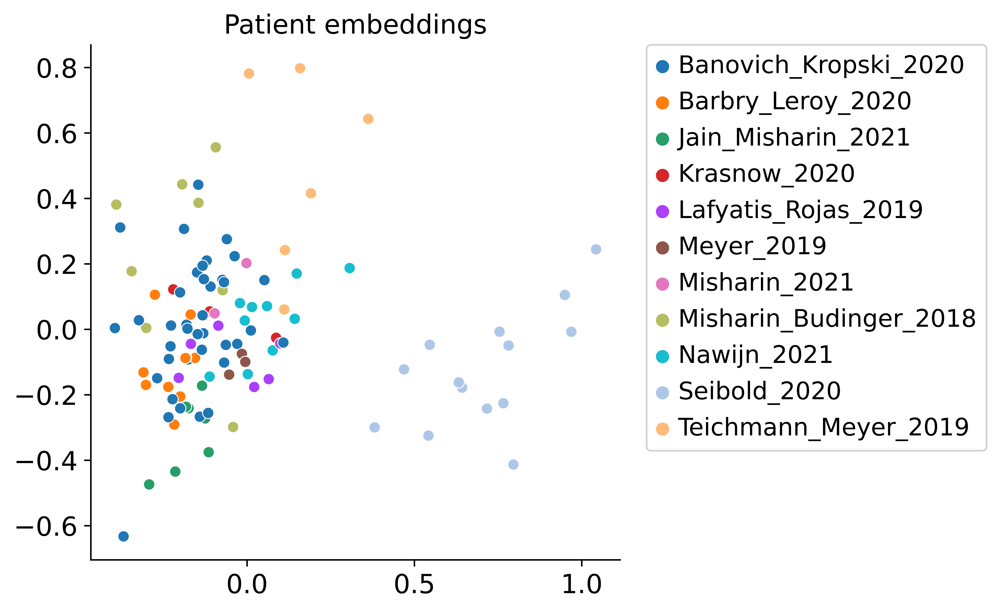

In [13]:
from sklearn.decomposition import KernelPCA

plot_key = 'study'
embedding = lataq_model.model.embedding.weight.detach().cpu().numpy()
pca = KernelPCA(n_components=5, kernel='linear')
emb_pca = pca.fit_transform(embedding)
cond = (
    adata
    .obs
    .groupby(condition_key)
    .first()
    .reindex(lataq_model.conditions_)
    [plot_key]
)
patient_id = lataq_model.conditions_

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
import seaborn as sns
sns.scatterplot(
    emb_pca[:, 0], 
    emb_pca[:, 1], 
    cond,
    #hue_order = cond_to_keep,
    #palette = 'Reds',
    ax=ax
)

#for i in range(emb_pca.shape[0]):
#    ax.text(
#        x=emb_pca[i, 0]+0.01,
#        y=emb_pca[i, 1]+0.01,
#        s=patient_id[i],
#        fontsize=5
#    )
ax.grid(False)
ax.set_title('Patient embeddings')
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
sns.despine()

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


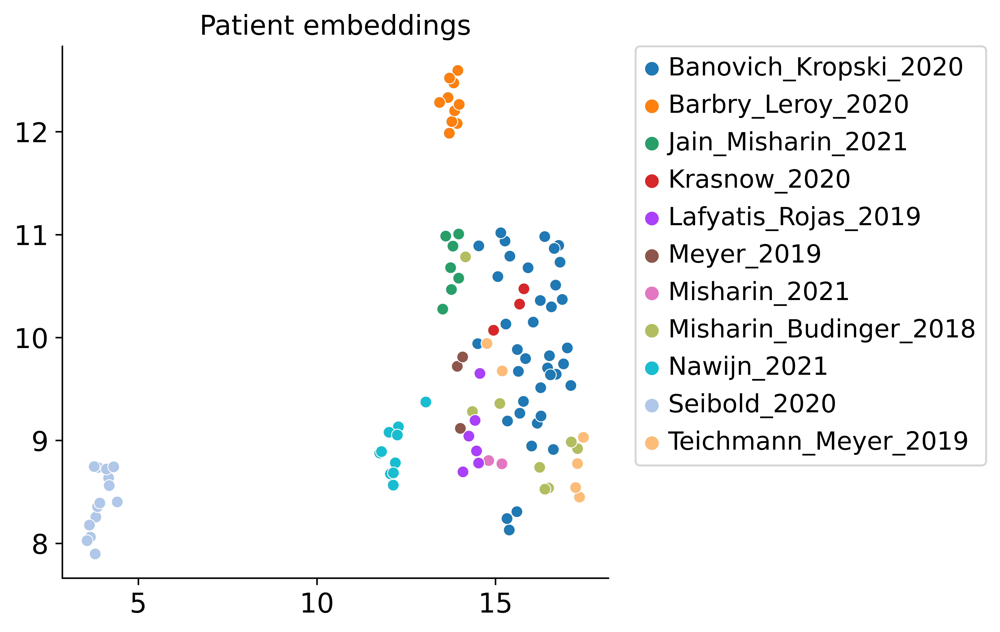

In [14]:
from sklearn.decomposition import KernelPCA
from umap import UMAP

plot_key = 'study'
embedding = lataq_model.model.embedding.weight.detach().cpu().numpy()
umap = UMAP()
emb_pca = umap.fit_transform(embedding)
cond = (
    adata
    .obs
    .groupby(condition_key)
    .first()
    .reindex(lataq_model.conditions_)
    [plot_key]
)
patient_id = lataq_model.conditions_

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
import seaborn as sns
sns.scatterplot(
    emb_pca[:, 0], 
    emb_pca[:, 1], 
    cond,
    #hue_order = cond_to_keep,
    #palette = 'Reds',
    ax=ax
)

#for i in range(emb_pca.shape[0]):
#    ax.text(
#        x=emb_pca[i, 0]+0.01,
#        y=emb_pca[i, 1]+0.01,
#        s=patient_id[i],
#        fontsize=5
#    )
ax.grid(False)
ax.set_title('Patient embeddings')
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
sns.despine()

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


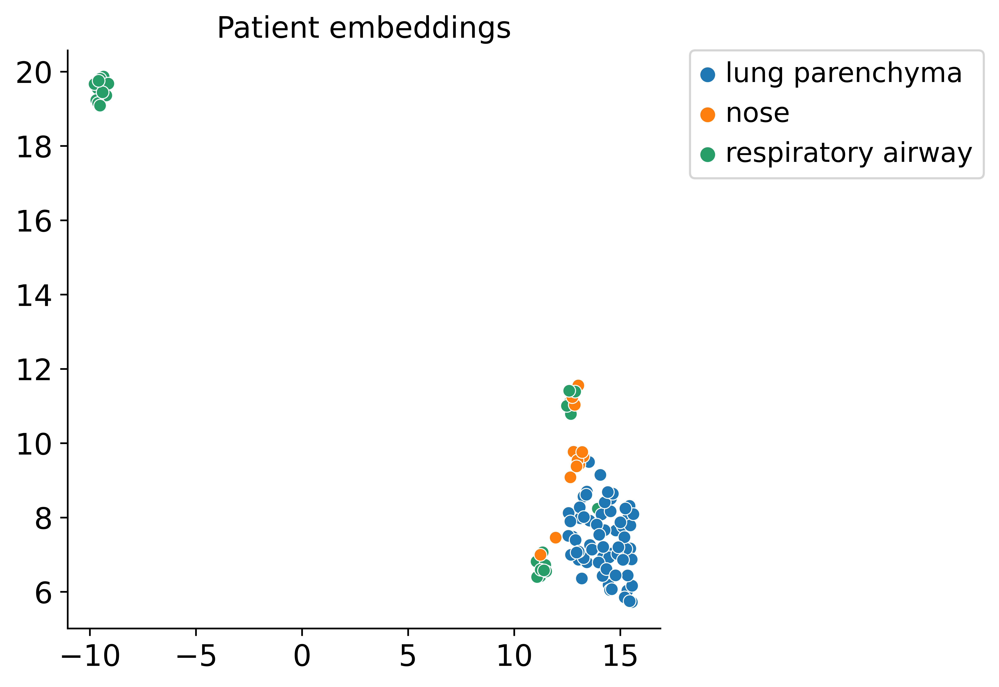

In [15]:
plot_key = 'tissue'
embedding = lataq_model.model.embedding.weight.detach().cpu().numpy()
umap = UMAP()
emb_pca = umap.fit_transform(embedding)
cond = (
    adata
    .obs
    .groupby(condition_key)
    .first()
    .reindex(lataq_model.conditions_)
    [plot_key]
)
patient_id = lataq_model.conditions_

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
import seaborn as sns
sns.scatterplot(
    emb_pca[:, 0], 
    emb_pca[:, 1], 
    cond,
    #hue_order = cond_to_keep,
    #palette = 'Reds',
    ax=ax
)

#for i in range(emb_pca.shape[0]):
#    ax.text(
#        x=emb_pca[i, 0]+0.01,
#        y=emb_pca[i, 1]+0.01,
#        s=patient_id[i],
#        fontsize=5
#    )
ax.grid(False)
ax.set_title('Patient embeddings')
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
sns.despine()

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


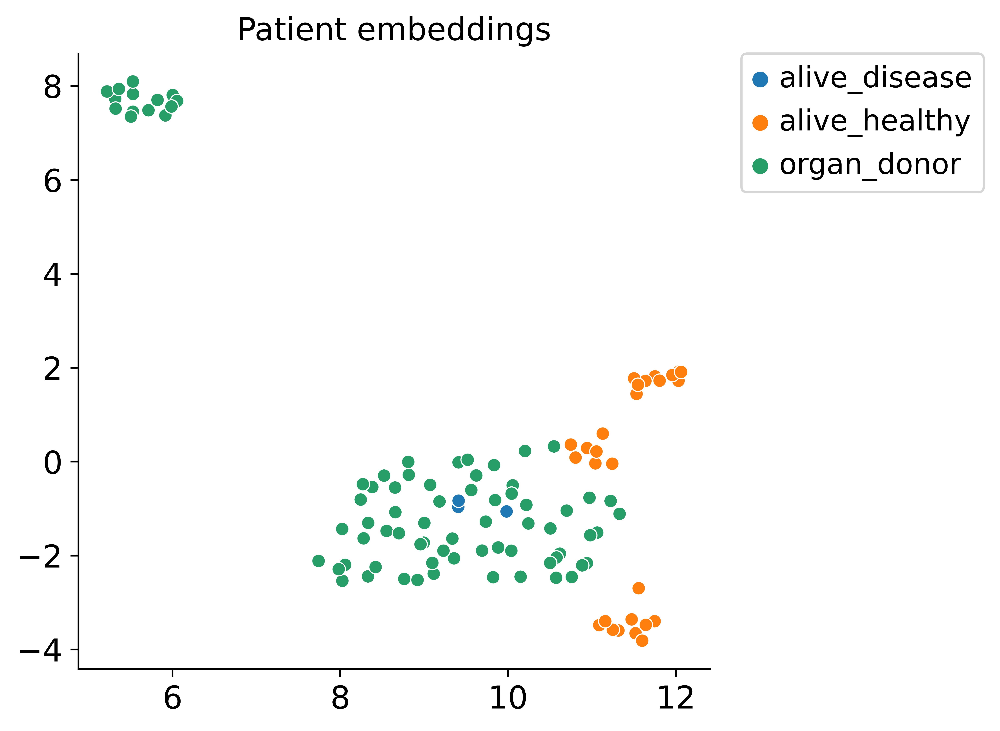

In [16]:
plot_key = 'subject_type'
embedding = lataq_model.model.embedding.weight.detach().cpu().numpy()
umap = UMAP()
emb_pca = umap.fit_transform(embedding)
cond = (
    adata
    .obs
    .groupby(condition_key)
    .first()
    .reindex(lataq_model.conditions_)
    [plot_key]
)
patient_id = lataq_model.conditions_

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
import seaborn as sns
sns.scatterplot(
    emb_pca[:, 0], 
    emb_pca[:, 1], 
    cond,
    #hue_order = cond_to_keep,
    #palette = 'Reds',
    ax=ax
)

#for i in range(emb_pca.shape[0]):
#    ax.text(
#        x=emb_pca[i, 0]+0.01,
#        y=emb_pca[i, 1]+0.01,
#        s=patient_id[i],
#        fontsize=5
#    )
ax.grid(False)
ax.set_title('Patient embeddings')
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
sns.despine()

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


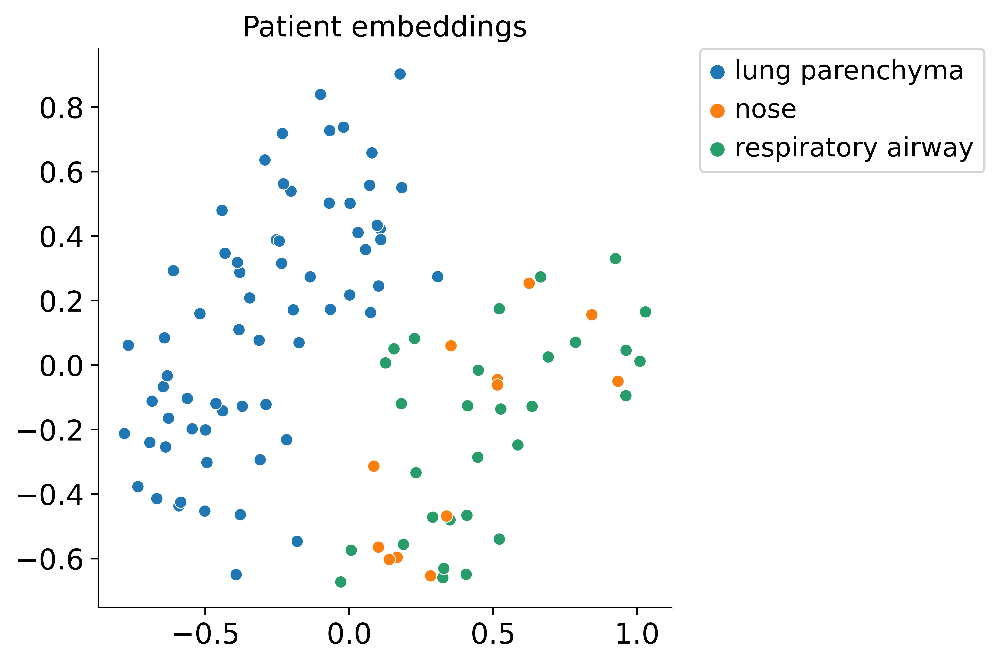

In [15]:
from sklearn.decomposition import KernelPCA

plot_key = 'tissue'
embedding = lataq_model.model.embedding.weight.detach().cpu().numpy()
pca = KernelPCA(n_components=5, kernel='cosine')
emb_pca = pca.fit_transform(embedding)
cond = (
    adata
    .obs
    .groupby(condition_key)
    .first()
    .reindex(lataq_model.conditions_)
    [plot_key]
)
patient_id = lataq_model.conditions_

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
import seaborn as sns
sns.scatterplot(
    emb_pca[:, 0], 
    emb_pca[:, 1], 
    cond,
    #hue_order = cond_to_keep,
    #palette = 'Reds',
    ax=ax
)

#for i in range(emb_pca.shape[0]):
#    ax.text(
#        x=emb_pca[i, 0]+0.01,
#        y=emb_pca[i, 1]+0.01,
#        s=patient_id[i],
#        fontsize=5
#    )
ax.grid(False)
ax.set_title('Patient embeddings')
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
sns.despine()

In [ ]:
adata.obs.columns

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


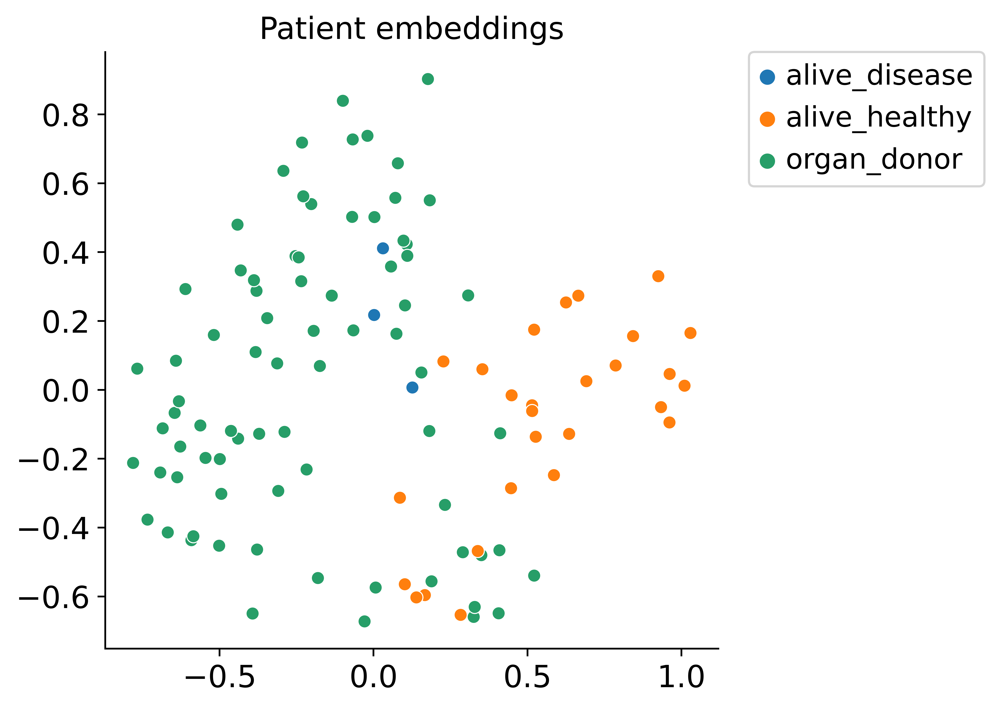

In [17]:
from sklearn.decomposition import KernelPCA

plot_key = 'subject_type'
embedding = lataq_model.model.embedding.weight.detach().cpu().numpy()
pca = KernelPCA(n_components=5, kernel='cosine')
emb_pca = pca.fit_transform(embedding)
cond = (
    adata
    .obs
    .groupby(condition_key)
    .first()
    .reindex(lataq_model.conditions_)
    [plot_key]
)
patient_id = lataq_model.conditions_

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
import seaborn as sns
sns.scatterplot(
    emb_pca[:, 0], 
    emb_pca[:, 1], 
    cond,
    #hue_order = cond_to_keep,
    #palette = 'Reds',
    ax=ax
)

#for i in range(emb_pca.shape[0]):
#    ax.text(
#        x=emb_pca[i, 0]+0.01,
#        y=emb_pca[i, 1]+0.01,
#        s=patient_id[i],
#        fontsize=5
#    )
ax.grid(False)
ax.set_title('Patient embeddings')
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
sns.despine()